Sources: 
- https://www.eia.gov/totalenergy/data/monthly/index.php#renewable
- https://www.eia.gov/environment/data.php
- https://www.statista.com/statistics/1343085/planned-electric-generation-capacity-retirements-us/

In [1]:
pip install prophet

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install pyspark

Note: you may need to restart the kernel to use updated packages.


In [1]:
import os #print(os.getcwd())
import random
import mplcursors
%matplotlib inline
import numpy as np
import pandas as pd
import plotly.io as pio
import plotly.express as px
from prophet import Prophet
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.spatial import cKDTree
import plotly.graph_objects as go
from prophet.plot import plot, plot_components

pio.renderers.default='svg'

from pyspark.sql.functions import *
from pyspark.sql import SparkSession

# Capacity Additions

In [4]:
pd.options.display.float_format = '{:.5f}'.format
df_ca = pd.read_excel('Data.xlsx', sheet_name='Capacity Additions')

renewables = ['Utility-Scale Solar CA (GW-AC)', 'Distributed Solar CA (GW-AC)', 'Wind CA (GW-AC)', 'Storage CA (GW-AC)', 'Other RE CA (GW-AC)']
non_renewables = ['Gas CA (GW-AC)', 'Coal CA (GW-AC)', 'Other non-RE CA (GW-AC)']

df_ca['Renewable CA (GW-AC)'] = (df_ca[renewables]).sum(axis=1)
df_ca['Non-renewable CA (GW-AC)'] = (df_ca[non_renewables]).sum(axis=1)

print(df_ca)

    Year  Utility-Scale Solar CA (GW-AC)  Distributed Solar CA (GW-AC)  \
0   1998                         0.00000                       0.00000   
1   1999                         0.00000                       0.00000   
2   2000                         0.00000                       0.00000   
3   2001                         0.00000                       0.00000   
4   2002                         0.00000                       0.00000   
5   2003                         0.00000                       0.00000   
6   2004                         0.00000                       0.05659   
7   2005                         0.00000                       0.07762   
8   2006                         0.00000                       0.10259   
9   2007                         0.08290                       0.15854   
10  2008                         0.01000                       0.29296   
11  2009                         0.05500                       0.36676   
12  2010                         0.149

In [4]:
sources = ['Utility-Scale Solar CA (GW-AC)', 'Distributed Solar CA (GW-AC)', 'Wind CA (GW-AC)', 'Storage CA (GW-AC)', 'Other RE CA (GW-AC)', 'Gas CA (GW-AC)', 'Coal CA (GW-AC)', 'Other non-RE CA (GW-AC)', 'Total CA (GW-AC)']

#fig, ax = plt.subplots()
#for source in sources: 
    #line, = ax.plot(df_ca['Year'], df_ca[source], label=source)
    #mplcursors.cursor([line], hover=True).connect("add", lambda sel: sel.annotation.set_text(source))
    
#ax.set_xlabel('Year')
#ax.set_ylabel('Capacity Additions (GW-AC)')
#ax.set_title('Capacity Additions')
#plt.legend()
#plt.show()

## Time Series Forecasting
#### Rename column

In [5]:
df_nr_ca = df_ca[['Year','Non-renewable CA (GW-AC)']].copy()
df_nr_ca = df_nr_ca.rename(columns={"Year": "ds", "Non-renewable CA (GW-AC)": "y"})
df_nr_ca = df_nr_ca.sort_values(by='ds')
#print(df_nr_ca)

#### Change data types

In [6]:
df_nr_ca.dtypes

ds      int64
y     float64
dtype: object

In [7]:
df_nr_ca['ds'] = pd.to_datetime(df_nr_ca['ds'], format='%Y')
df_nr_ca.dtypes

ds    datetime64[ns]
y            float64
dtype: object

#### Time series plot

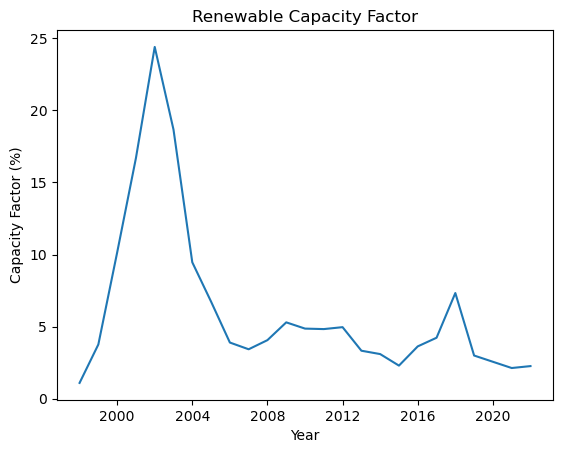

In [8]:
#plt.figure(figsize=(10, 6))
plt.plot(df_nr_ca['ds'], df_nr_ca['y'])
plt.xlabel('Year')
plt.ylabel('Capacity Factor (%)')
plt.title('Renewable Capacity Factor')
plt.show()

#### Out-of-sample forecasting

10:12:36 - cmdstanpy - INFO - Chain [1] start processing
10:12:36 - cmdstanpy - INFO - Chain [1] done processing


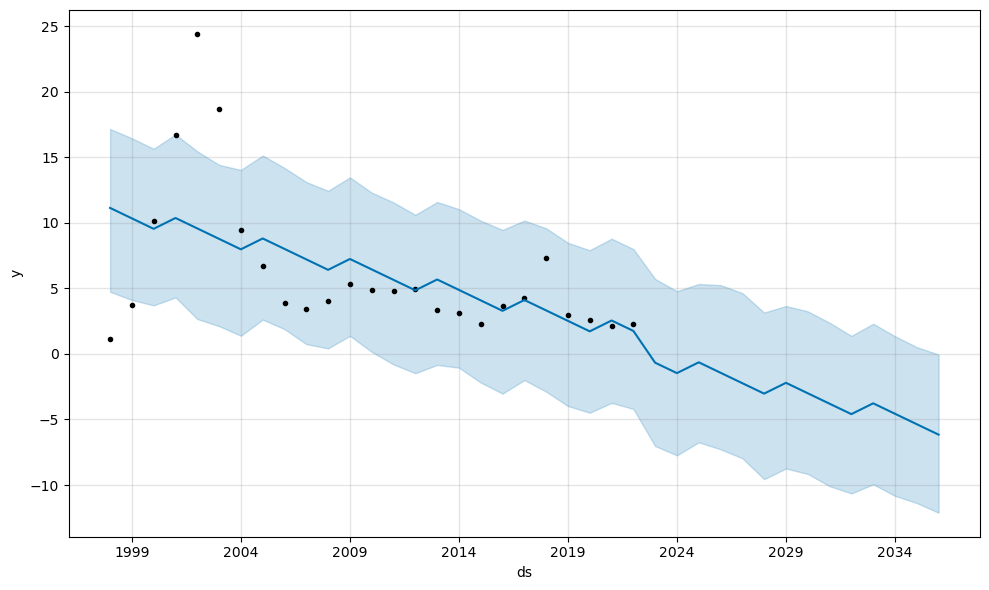

In [9]:
model = Prophet()
model.fit(df_nr_ca)
future_years = model.make_future_dataframe(periods=14, freq='Y', include_history=True)
forecast_years = model.predict(future_years)

forecasted_nr_ca = forecast_years[['ds', 'yhat']]
forecasted_nr_ca = forecasted_nr_ca.rename(columns={"yhat": "yhat_nrca"})

plot(model, forecast_years)
#plot_components(model, forecast_r_cf)
plt.show()

In [10]:
forecasted_ca = forecasted_nr_ca[['ds','yhat_nrca']].copy()
#print(forecasted_ca)

filtered_ca = forecasted_ca[(forecasted_ca['ds'] >= '2023-01-01') & (forecasted_ca['ds'] <= '2035-12-31')]
list_nrca = filtered_ca['yhat_nrca'].tolist() 

list_nrca = [float(value) for value in list_nrca]

print(list_nrca)
print()

[-1.4638092922627202, -0.6392362070499882, -1.436374407618601, -2.2325387434979262, -3.0272474268236707, -2.202674341613397, -2.999812542185369, -3.7959768780599816, -4.590685561391849, -3.766112476180753, -4.563250676745641, -5.359415012630723, -6.154123695953475]



# Capacity Factor

In [11]:
df_cf = pd.read_excel('Data.xlsx', sheet_name='Capacity & Usage Factor')
print(df_cf)

    Year  Coal CF (%)  Petroleum CF (%)  \
0   2008     72.40000           9.70000   
1   2009     64.20000           9.30000   
2   2010     67.10000           8.40000   
3   2011     62.80000           7.40000   
4   2012     56.20000           7.60000   
5   2013     59.40000           6.60000   
6   2014     60.50000           6.70000   
7   2015     54.30000           6.70000   
8   2016     52.80000           5.90000   
9   2017     53.10000           6.30000   
10  2018     53.60000           6.60000   
11  2019     47.50000           5.50000   
12  2020     40.50000           5.20000   
13  2021     49.10000           5.50000   
14  2022     48.40000           5.40000   
15  2023     42.10000           4.70000   

    Natural Gas Combined Cycle Plants CF (%)  \
0                                   40.30000   
1                                   43.90000   
2                                   44.30000   
3                                   44.30000   
4                           

## Feature Extraction
The sum of renewable & non-renewable energy capacity factors

In [12]:
renewables = ['Hydroelectric CF (%)', 'Biomass CF (%)', 'Geothermal CF (%)', 'Solar Photovoltaic CF (%)', 'Solar Thermal CF (%)', 'Wind CF (%)']
others = ['Coal CF (%)', 'Petroleum CF (%)', 'Total Natural Gas CF (%)']

df_cf['Renewable CF%'] = (df_cf[renewables] / 100).mean(axis=1) * 100
df_cf['Non-Renewable CF%'] = (df_cf[others] / 100).mean(axis=1) * 100

print(df_cf)

    Year  Coal CF (%)  Petroleum CF (%)  \
0   2008     72.40000           9.70000   
1   2009     64.20000           9.30000   
2   2010     67.10000           8.40000   
3   2011     62.80000           7.40000   
4   2012     56.20000           7.60000   
5   2013     59.40000           6.60000   
6   2014     60.50000           6.70000   
7   2015     54.30000           6.70000   
8   2016     52.80000           5.90000   
9   2017     53.10000           6.30000   
10  2018     53.60000           6.60000   
11  2019     47.50000           5.50000   
12  2020     40.50000           5.20000   
13  2021     49.10000           5.50000   
14  2022     48.40000           5.40000   
15  2023     42.10000           4.70000   

    Natural Gas Combined Cycle Plants CF (%)  \
0                                   40.30000   
1                                   43.90000   
2                                   44.30000   
3                                   44.30000   
4                           

## Time Series Forecasting
#### Rename columns

In [13]:
df_r_cf = df_cf[['Year','Renewable CF%']].copy()
df_r_cf = df_r_cf.rename(columns={"Year": "ds", "Renewable CF%": "y"})
df_r_cf = df_r_cf.sort_values(by='ds')
#print(df_r_cf)

df_nr_cf = df_cf[['Year','Non-Renewable CF%']].copy()
df_nr_cf = df_nr_cf.rename(columns={"Year": "ds", "Non-Renewable CF%": "y"})
df_nr_cf = df_nr_cf.sort_values(by='ds')
#print(df_nr_cf)

df_n_cf = df_cf[['Year','Nuclear CF (%)']].copy()
df_n_cf = df_n_cf.rename(columns={"Year": "ds", "Nuclear CF (%)": "y"})
df_n_cf = df_n_cf.sort_values(by='ds')
#print(df_n_cf)

#### Change data types

In [14]:
df_r_cf.dtypes
df_nr_cf.dtypes
df_n_cf.dtypes

ds      int64
y     float64
dtype: object

In [15]:
df_r_cf['ds'] = pd.to_datetime(df_r_cf['ds'], format='%Y')
df_r_cf.dtypes

df_nr_cf['ds'] = pd.to_datetime(df_nr_cf['ds'], format='%Y')
df_nr_cf.dtypes

df_n_cf['ds'] = pd.to_datetime(df_n_cf['ds'], format='%Y')
df_n_cf.dtypes

ds    datetime64[ns]
y            float64
dtype: object

#### Time series plot

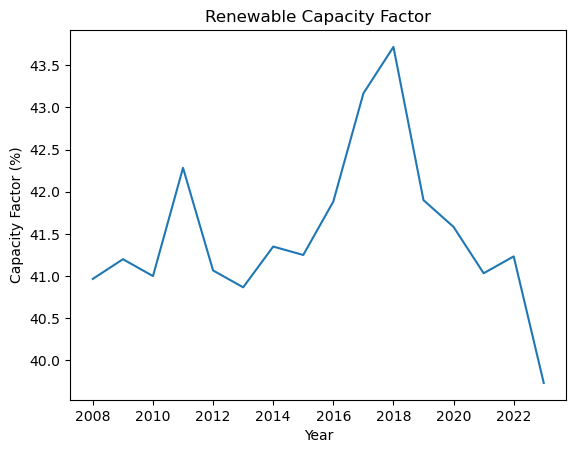

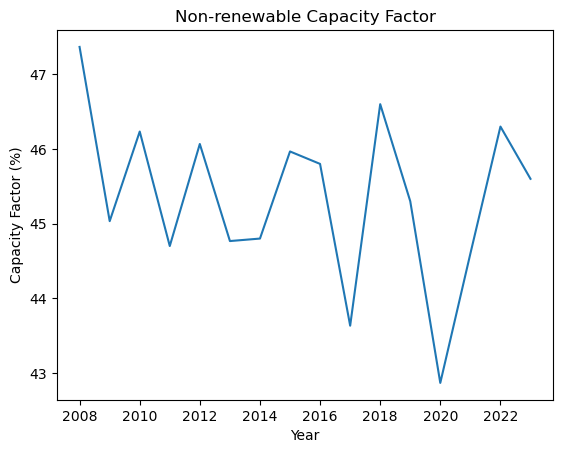

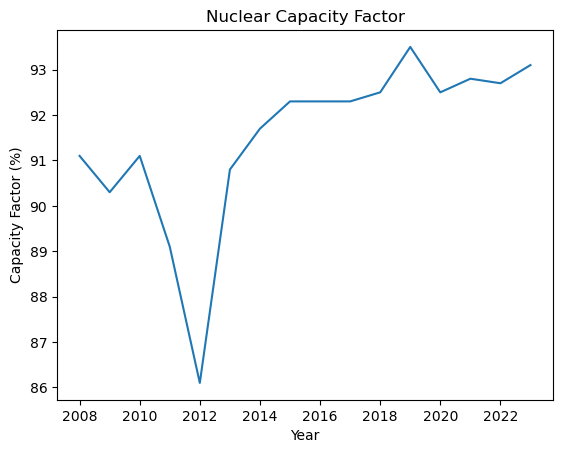

In [16]:
#plt.figure(figsize=(10, 6))
plt.plot(df_r_cf['ds'], df_r_cf['y'])
plt.xlabel('Year')
plt.ylabel('Capacity Factor (%)')
plt.title('Renewable Capacity Factor')
#plt.show()

#plt.figure(figsize=(10, 6))
plt.plot(df_nr_cf['ds'], df_nr_cf['y'])
plt.xlabel('Year')
plt.ylabel('Capacity Factor (%)')
plt.title('Non-renewable Capacity Factor')
#plt.show()

#plt.figure(figsize=(10, 6))
plt.plot(df_n_cf['ds'], df_n_cf['y'])
plt.xlabel('Year')
plt.ylabel('Capacity Factor (%)')
plt.title('Nuclear Capacity Factor')
#plt.show()

#### Ouf-of-sample forecasting

10:13:26 - cmdstanpy - INFO - Chain [1] start processing
10:13:26 - cmdstanpy - INFO - Chain [1] done processing


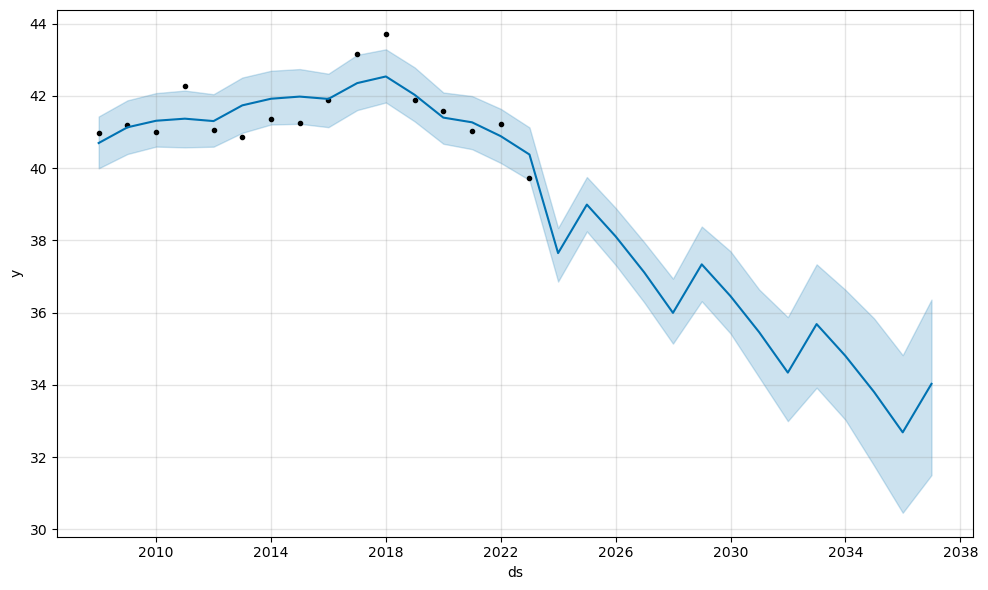

10:13:27 - cmdstanpy - INFO - Chain [1] start processing
10:13:27 - cmdstanpy - INFO - Chain [1] done processing


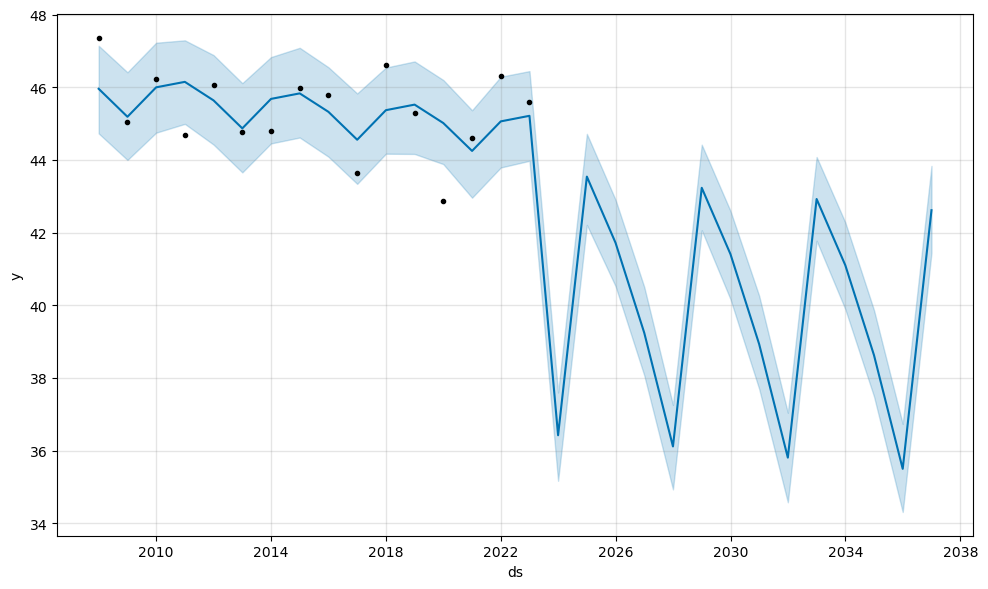

10:13:27 - cmdstanpy - INFO - Chain [1] start processing
10:13:27 - cmdstanpy - INFO - Chain [1] done processing


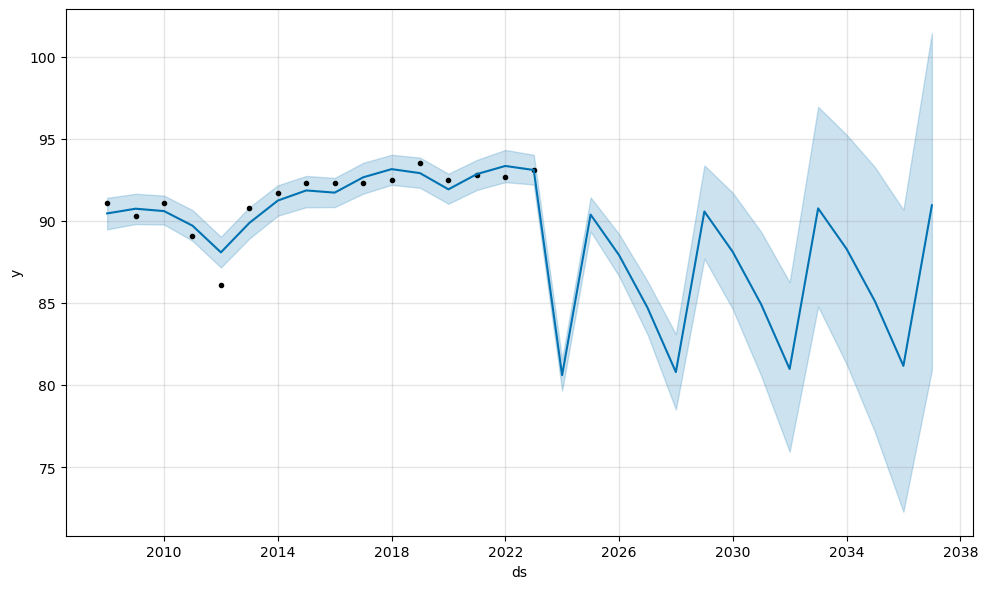

In [17]:
model = Prophet()
model.fit(df_r_cf)
future_years = model.make_future_dataframe(periods=14, freq='Y', include_history=True)
forecast_years = model.predict(future_years)

forecasted_r_cf = forecast_years[['ds', 'yhat']]
forecasted_r_cf = forecasted_r_cf.rename(columns={"yhat": "yhat_rcf"})

plot(model, forecast_years)
#plot_components(model, forecast_r_cf)
plt.show()

model = Prophet()
model.fit(df_nr_cf)
future_years = model.make_future_dataframe(periods=14, freq='Y', include_history=True)
forecast_years = model.predict(future_years)

forecasted_nr_cf = forecast_years[['ds', 'yhat']]
forecasted_nr_cf = forecasted_nr_cf.rename(columns={"yhat": "yhat_nrcf"})

plot(model, forecast_years)
#plot_components(model, forecast_years)
plt.show()

model = Prophet()
model.fit(df_n_cf)
future_years = model.make_future_dataframe(periods=14, freq='Y', include_history=True)
forecast_years = model.predict(future_years)

forecasted_n_cf = forecast_years[['ds', 'yhat']]
forecasted_n_cf = forecasted_n_cf.rename(columns={"yhat": "yhat_ncf"})

plot(model, forecast_years)
#plot_components(model, forecast_years)
plt.show()

In [18]:
forecasted_cf = forecasted_r_cf[['ds','yhat_rcf']].copy()
forecasted_cf['yhat_nrcf'] = forecasted_nr_cf[['yhat_nrcf']].copy()
forecasted_cf['yhat_ncf'] = forecasted_n_cf[['yhat_ncf']].copy()
print(forecasted_cf)

filtered_cf = forecasted_cf[(forecasted_cf['ds'] >= '2023-01-01') & (forecasted_cf['ds'] <= '2035-12-31')]
list_rcf = filtered_cf['yhat_rcf'].tolist() 
list_nrcf = filtered_cf['yhat_nrcf'].tolist() 
list_ncf = filtered_cf['yhat_ncf'].tolist() 

list_rcf = [float(value) for value in list_rcf]

print(list_rcf)
print()
print(list_nrcf)
print()
print(list_ncf)

           ds  yhat_rcf  yhat_nrcf  yhat_ncf
0  2008-01-01  40.69563   45.95802  90.45389
1  2009-01-01  41.13131   45.18808  90.74079
2  2010-01-01  41.31289   45.99843  90.59487
3  2011-01-01  41.37018   46.14870  89.70745
4  2012-01-01  41.30354   45.63891  88.08000
5  2013-01-01  41.73923   44.86913  89.87659
6  2014-01-01  41.92250   45.68002  91.23624
7  2015-01-01  41.98157   45.83189  91.85439
8  2016-01-01  41.91719   45.32419  91.71997
9  2017-01-01  42.35514   44.55645  92.65346
10 2018-01-01  42.53897   45.36960  93.15237
11 2019-01-01  42.03199   45.52265  92.90977
12 2020-01-01  41.40014   45.01559  91.92150
13 2021-01-01  41.26906   44.24845  92.85088
14 2022-01-01  40.88544   45.06160  93.34568
15 2023-01-01  40.37753   45.21465  93.09897
16 2023-12-31  37.64728   36.42511  80.59581
17 2024-12-31  38.99043   43.54150  90.38208
18 2025-12-31  38.11254   41.71862  87.91557
19 2026-12-31  37.11296   39.24233  84.71489
20 2027-12-31  35.99281   36.11711  80.78501
21 2028-12

# Electricity Net Generation

In [19]:
df_eng = pd.read_excel('Data.xlsx', sheet_name='Electricity Net Generation')
#print(df_eng)

In [20]:
pd.options.display.float_format = '{:.0f}'.format
df_eng['Year'] = df_eng['YYYYMM'].astype(str).str[:4].astype(int)

# Group by year and sum the values
df_eng = df_eng.groupby(['Year', 'Energy Sources'])['ENG (Million Kilowatthours)'].sum().reset_index()

df_eng['ENG (Kilowatthours)'] = df_eng['ENG (Million Kilowatthours)'] * 1_000_000
df_eng.drop(columns=['ENG (Million Kilowatthours)'], inplace=True)

print(df_eng)

     Year                    Energy Sources  ENG (Kilowatthours)
0    1998                              Coal        3747031379000
1    1998  Conventional Hydroelectric Power         646671322000
2    1998                        Geothermal          29547835000
3    1998      Hydroelectric Pumped Storage          -8934561000
4    1998                       Natural Gas        1062514208000
..    ...                               ...                  ...
320  2022                             Solar         287593809000
321  2022   Total (including other sources)        8461344466000
322  2022                             Waste          32766815000
323  2022                              Wind         868594718000
324  2022                              Wood          70927135000

[325 rows x 3 columns]


In [21]:
#Pivot operation
df_pivot_eng = df_eng.pivot(index='Year', columns='Energy Sources', values='ENG (Kilowatthours)').reset_index()

#Remove the column name for cleaner output
df_pivot_eng.columns.name = None 

#Fill missing values with 0
df_pivot_eng = df_pivot_eng.fillna(0)

#print(df_pivot_eng)

In [22]:
#Rename the columns
df_pivot_eng = df_pivot_eng.rename(columns={'Coal': 'Coal ENG (KWHs)', 'Petroleum': 'Petroleum ENG (KWHs)', 'Natural Gas': 'Natural Gas ENG (KWHs)', 'Other Gases': 'OG ENG (KWHs)', 'Nuclear Electric Power': 'NEP ENG (KWHs)', 'Hydroelectric Pumped Storage': 'HPS ENG (KWHs)', 'Conventional Hydroelectric Power': 'CHP ENG (KWHs)', 'Wood': 'Wood ENG (KWHs)', 'Waste': 'Waste ENG (KWHs)', 'Geothermal': 'Geothermal ENG (KWHs)', 'Solar': 'Solar ENG (KWHs)', 'Wind': 'Wind ENG (KWHs)', 'Total (including other sources)': 'Total (IOS) ENG (KWHs)'})
#print(df_pivot_eng)

In [23]:
#sources = ['Total (IOS) ENG (KWHs)', 'NEP ENG (KWHs)', 'OG ENG (KWHs)', 'Petroleum ENG (KWHs)', 'Natural Gas ENG (KWHs)', 'Coal ENG (KWHs)', 'CHP ENG (KWHs)', 'Geothermal ENG (KWHs)', 'HPS ENG (KWHs)', 'Solar ENG (KWHs)', 'Wind ENG (KWHs)', 'Waste ENG (KWHs)', 'Wood ENG (KWHs)']

#fig, ax = plt.subplots()
#for source in sources: 
#    line, = ax.plot(df_pivot_eng['Year'], df_pivot_eng[source], label=source)
#    mplcursors.cursor([line], hover=True).connect("add", lambda sel: sel.annotation.set_text(source))
    
#ax.set_xlabel('Year')
#ax.set_ylabel('Electricity Generation (KWHs)')
#ax.set_title('Electricity Generation of Each Source')
#plt.legend()
#plt.show()

## Feature Extraction
The sum of renewable & non-renewable energy electricity net generation

In [24]:
# Didn't take other gases into, i did
renewables = ['CHP ENG (KWHs)', 'Geothermal ENG (KWHs)', 'HPS ENG (KWHs)', 'Solar ENG (KWHs)', 'Wind ENG (KWHs)', 'Waste ENG (KWHs)', 'Wood ENG (KWHs)']
non_renewables = ['Coal ENG (KWHs)', 'Natural Gas ENG (KWHs)', 'Petroleum ENG (KWHs)', 'OG ENG (KWHs)']

df_pivot_eng['Renewable ENG (KWHs)'] = (df_pivot_eng[renewables]).sum(axis=1)
df_pivot_eng['Non-renewable ENG (KWHs)'] = (df_pivot_eng[non_renewables]).sum(axis=1)

print(df_pivot_eng)

    Year  Coal ENG (KWHs)  CHP ENG (KWHs)  Geothermal ENG (KWHs)  \
0   1998    3747031379000    646671322000            29547835000   
1   1999    3762174448000    639072059000            29654025000   
2   2000    3932529192000    551145193000            28186316000   
3   2001    3807911884000    433922090000            27481002000   
4   2002    3866260708000    528657662000            28982620000   
5   2003    3947473504000    551612646000            28848462000   
6   2004    3956601097000    536834615000            29621949000   
7   2005    4025746091000    540642512000            29383488000   
8   2006    3981022270000    578492832000            29136057000   
9   2007    4032911169000    495019949000            29274425000   
10  2008    3971602492000    509662768000            29679953000   
11  2009    3511808506000    546890189000            30017317000   
12  2010    3694580557000    520406137000            30438426000   
13  2011    3466860010000    638709808000       

In [25]:
columns = ['NEP ENG (KWHs)', 'Renewable ENG (KWHs)', 'Non-renewable ENG (KWHs)']

dataframe_eng = df_pivot_eng[['Year', 'NEP ENG (KWHs)', 'Renewable ENG (KWHs)', 'Non-renewable ENG (KWHs)']].copy()

for column in columns: 
    dataframe_eng[column] /= 1_000_000
    
dataframe_eng = dataframe_eng.rename(columns={"NEP ENG (KWHs)": "NEP ENG (GWh)", "Renewable ENG (KWHs)": "Renewable ENG (GWh)", "Non-renewable ENG (KWHs)": "Non-renewable ENG (GWh)"})

print(dataframe_eng)

    Year  NEP ENG (GWh)  Renewable ENG (GWh)  Non-renewable ENG (GWh)
0   1998        1347404               791914                  5094130
1   1999        1456508               785724                  5139340
2   2000        1507786               701879                  5384957
3   2001        1537653               557812                  5354010
4   2002        1560128               669390                  5460332
5   2003        1527465               693516                  5517300
6   2004        1577057               685993                  5649596
7   2005        1563973               702186                  5819045
8   2006        1574437               758428                  5770590
9   2007        1612850               691702                  5984475
10  2008        1612417               749289                  5853463
11  2009        1597709               826193                  5452903
12  2010        1613937               843750                  5766723
13  2011        1580

## Time Series Forecasting
#### Rename columns

In [26]:
df_r_eng = dataframe_eng[['Year','Renewable ENG (GWh)']].copy()
df_r_eng = df_r_eng.rename(columns={"Year": "ds", "Renewable ENG (GWh)": "y"})
df_r_eng = df_r_eng.sort_values(by='ds')
#print(df_r_eng)

df_nr_eng = dataframe_eng[['Year','Non-renewable ENG (GWh)']].copy()
df_nr_eng = df_nr_eng.rename(columns={"Year": "ds", "Non-renewable ENG (GWh)": "y"})
df_nr_eng = df_nr_eng.sort_values(by='ds')
#print(df_nr_eng)

df_n_eng = dataframe_eng[['Year','NEP ENG (GWh)']].copy()
df_n_eng = df_n_eng.rename(columns={"Year": "ds", "NEP ENG (GWh)": "y"})
df_n_eng = df_n_eng.sort_values(by='ds')
#print(df_n_eng)

#### Change data types

In [27]:
df_r_eng.dtypes
df_nr_eng.dtypes
df_n_eng.dtypes

ds      int32
y     float64
dtype: object

In [28]:
df_r_eng['ds'] = pd.to_datetime(df_r_eng['ds'], format='%Y')
df_r_eng.dtypes

df_nr_eng['ds'] = pd.to_datetime(df_nr_eng['ds'], format='%Y')
df_nr_eng.dtypes

df_n_eng['ds'] = pd.to_datetime(df_n_eng['ds'], format='%Y')
df_n_eng.dtypes

ds    datetime64[ns]
y            float64
dtype: object

#### Time series plot

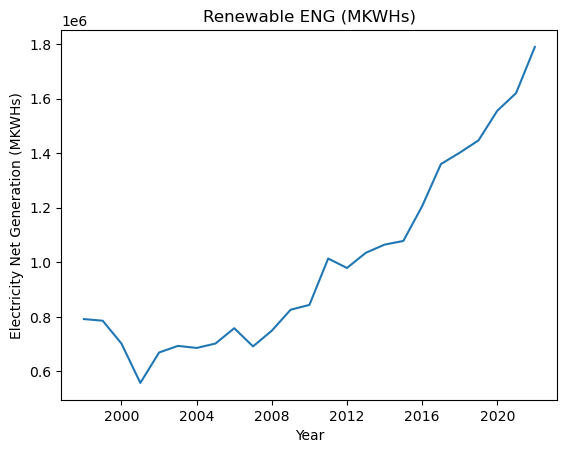

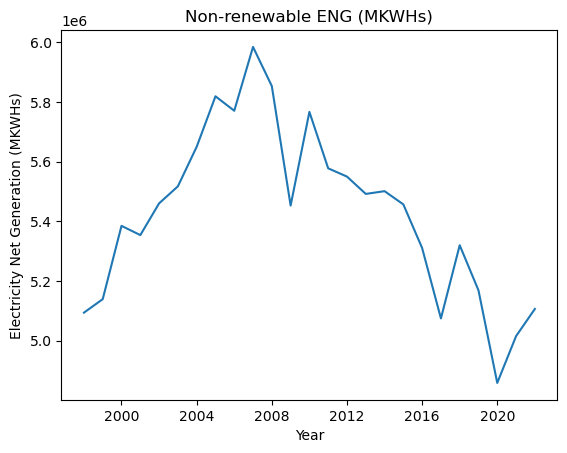

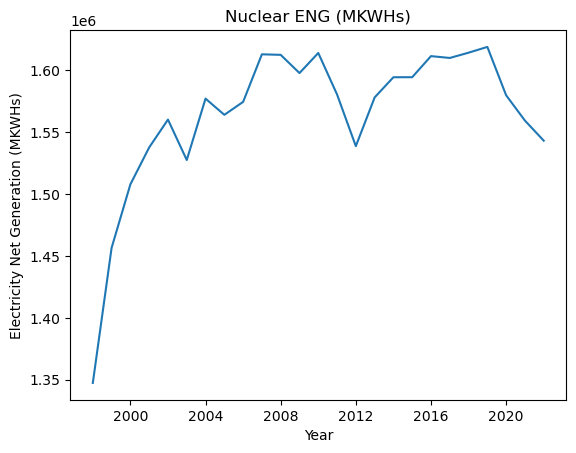

In [29]:
#plt.figure(figsize=(10, 6))
plt.plot(df_r_eng['ds'], df_r_eng['y'])
plt.xlabel('Year')
plt.ylabel('Electricity Net Generation (MKWHs)')
plt.title('Renewable ENG (MKWHs)')
plt.show()

#plt.figure(figsize=(10, 6))
plt.plot(df_nr_eng['ds'], df_nr_eng['y'])
plt.xlabel('Year')
plt.ylabel('Electricity Net Generation (MKWHs)')
plt.title('Non-renewable ENG (MKWHs)')
plt.show()

#plt.figure(figsize=(10, 6))
plt.plot(df_n_eng['ds'], df_n_eng['y'])
plt.xlabel('Year')
plt.ylabel('Electricity Net Generation (MKWHs)')
plt.title('Nuclear ENG (MKWHs)')
plt.show()

#### Out-of-sample forecasting

10:14:49 - cmdstanpy - INFO - Chain [1] start processing
10:14:49 - cmdstanpy - INFO - Chain [1] done processing


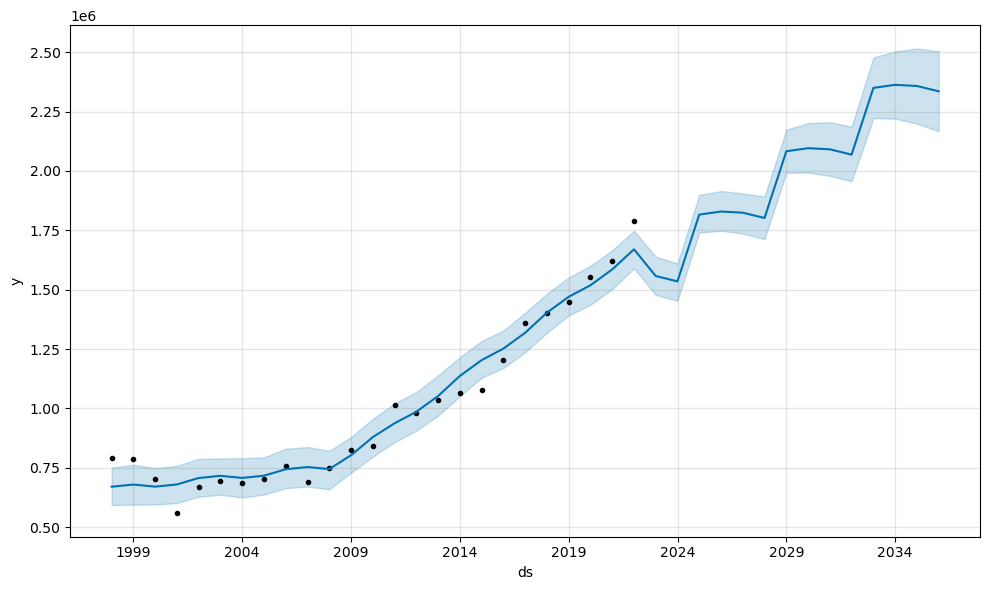

10:14:49 - cmdstanpy - INFO - Chain [1] start processing
10:14:50 - cmdstanpy - INFO - Chain [1] done processing


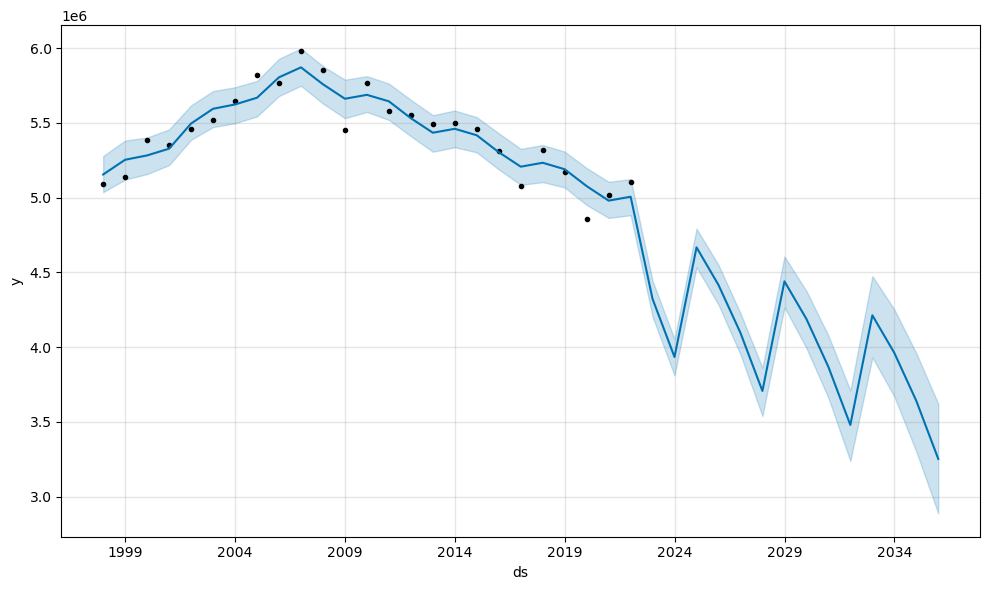

10:14:50 - cmdstanpy - INFO - Chain [1] start processing
10:14:51 - cmdstanpy - INFO - Chain [1] done processing


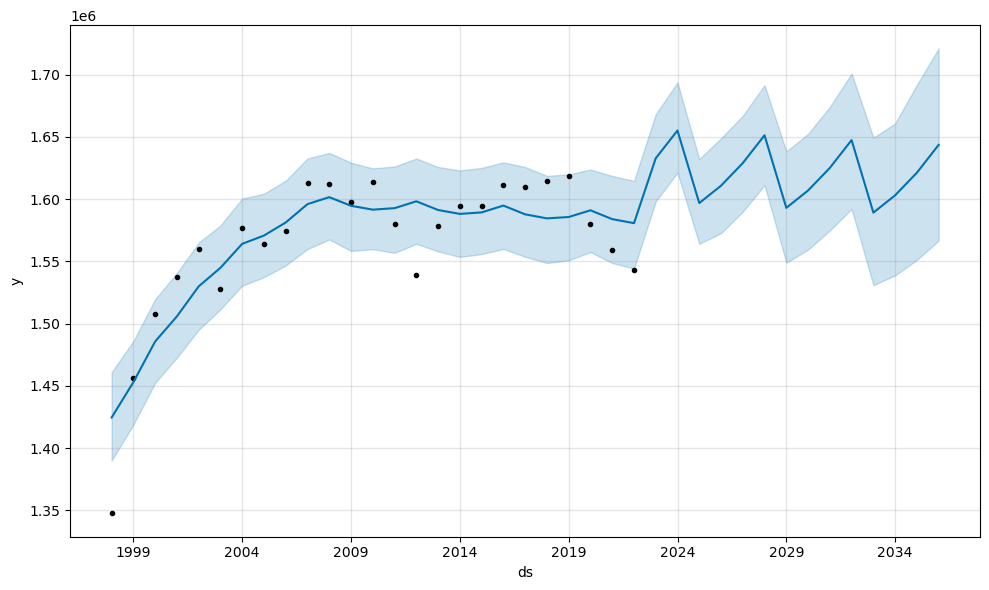

In [30]:
model = Prophet()
model.fit(df_r_eng)
future_years = model.make_future_dataframe(periods=14, freq='Y', include_history=True)
forecast_years = model.predict(future_years)

forecasted_r_eng = forecast_years[['ds', 'yhat']]
forecasted_r_eng = forecasted_r_eng.rename(columns={"yhat": "yhat_reng"})

plot(model, forecast_years)
#plot_components(model, forecast_years)
plt.show()

model = Prophet()
model.fit(df_nr_eng)
future_years = model.make_future_dataframe(periods=14, freq='Y', include_history=True)
forecast_years = model.predict(future_years)

forecasted_nr_eng = forecast_years[['ds', 'yhat']]
forecasted_nr_eng = forecasted_nr_eng.rename(columns={"yhat": "yhat_nreng"})

plot(model, forecast_years)
#plot_components(model, forecast_years)
plt.show()

model = Prophet()
model.fit(df_n_eng)
future_years = model.make_future_dataframe(periods=14, freq='Y', include_history=True)
forecast_years = model.predict(future_years)

forecasted_n_eng = forecast_years[['ds', 'yhat']]
forecasted_n_eng = forecasted_n_eng.rename(columns={"yhat": "yhat_neng"})

plot(model, forecast_years)
#plot_components(model, forecast_years)
plt.show()

In [31]:
forecasted_eng = forecasted_r_eng[['ds','yhat_reng']].copy()
forecasted_eng['yhat_nreng'] = forecasted_nr_eng[['yhat_nreng']].copy()
forecasted_eng['yhat_neng'] = forecasted_n_eng[['yhat_neng']].copy()
#print(forecasted_eng)

filtered_eng = forecasted_eng[(forecasted_eng['ds'] >= '2023-01-01') & (forecasted_eng['ds'] <= '2035-12-31')]
list_reng = filtered_eng['yhat_reng'].tolist() 
list_nreng = filtered_eng['yhat_nreng'].tolist() 
list_neng = filtered_eng['yhat_neng'].tolist() 

list_reng = [float(value) for value in list_reng]
list_nreng = [float(value) for value in list_nreng]
list_neng = [float(value) for value in list_neng]

print(list_reng)
print()
print(list_nreng)
print()
print(list_neng)

[1535100.2954508534, 1816178.3588184277, 1829099.94754363, 1824273.6908700154, 1801827.6464373446, 2082905.7098038285, 2095827.2985285106, 2091001.0418552025, 2068554.9974210006, 2349633.060788632, 2362554.6495145448, 2357728.392839603, 2335282.348406772]

[3933719.858353415, 4667444.710619732, 4415758.926766275, 4095246.430392211, 3706406.591243593, 4440131.4435055945, 4188445.65965023, 3867933.163277042, 3479093.324122698, 4212818.176389135, 3961132.392538561, 3640619.8961594435, 3251780.0570099275]

[1655140.257591081, 1596853.0843221638, 1610788.6674259237, 1628949.003371043, 1651292.547776984, 1593005.3745084277, 1606940.957612327, 1625101.2935574304, 1647444.8379637715, 1589157.6646949016, 1603093.247798386, 1621253.5837438814, 1643597.1281499392]


# Monte Carlo Model

In [32]:
def get_random_ca(years: int):
    """
    Generates a list of random capacity additions for the length of years required.
    """
    random_ca = []
    
    min = 60
    max = 70
    mean = (min + max) / 2
    std_dev = (max - min) / 1
    
    random_ca = np.random.normal(mean, std_dev, years)
    
    return random_ca

def get_confidence_levels(pot_sizes):    
    upper_confidence = round(np.quantile(pot_sizes, 0.975), 2)
    lower_confidence = round(np.quantile(pot_sizes, 0.025), 2)
    
    return lower_confidence, upper_confidence

def get_yearly_percentiles(results, inputs) -> pd.DataFrame:
    """
    Finds the percentiles for each year.
    """
    results_rotated = list(zip(*results[::-1]))

    year = []
    age = []
    ninetieth_percentile = []
    seventy_fifth_percentile = []
    median = []
    twenty_fifth_percentile = []
    tenth_percentile = []
    
    for i, year_results in enumerate(results_rotated):
        new_age = (inputs['start_age'] + 1) + i
        ninetieth_percentile_value = np.percentile(year_results, 90)
        seventy_fifth_percentile_value = np.percentile(year_results, 75)
        median_value = np.median(year_results)
        twenty_fifth_percentile_value = np.percentile(year_results, 25)
        tenth_percentile_value = np.percentile(year_results, 10)
        
        year.append(i + 1)
        age.append(new_age)
        ninetieth_percentile.append(ninetieth_percentile_value)
        seventy_fifth_percentile.append(seventy_fifth_percentile_value)
        median.append(median_value)
        twenty_fifth_percentile.append(twenty_fifth_percentile_value)
        tenth_percentile.append(tenth_percentile_value)
        

    return pd.DataFrame(
        list(
            zip(year,
                age,
                ninetieth_percentile, 
                seventy_fifth_percentile,
                median, 
                twenty_fifth_percentile,
                tenth_percentile)
        ),
        columns=[
            'year',
            'age',
            '90th_percentile',
            '75th_percentile',
            'median', 
            '25th_percentile',
            '10th_percentile']
    )

In [33]:
def plot_histogram(pot_sizes: list, 
                   upper_confidence:float, 
                   lower_confidence: float):
    """
    Plots the frequencies of the final pot sizes.
    """
    fig = px.histogram(pot_sizes, 
                       title=f"The final pot size after {len(pot_sizes)} simulations.")
    
    fig.add_vline(x=lower_confidence, 
                  line_width=3, 
                  line_dash="dash", 
                  line_color="green")
    
    fig.add_vline(x=upper_confidence, 
                  line_width=3, 
                  line_dash="dash", 
                  line_color="green")
    
    fig.add_vline(x=np.median(pot_sizes), 
                  line_width=3, 
                  line_dash="dash", 
                  line_color="black",
                  annotation_text="median",
                  annotation_font_size=15)
    
    fig.add_vrect(x0=lower_confidence, 
                  x1=upper_confidence, 
                  line_width=0, 
                  fillcolor="green",
                  opacity=0.2,
                  annotation_text="95% confidence interval",
                  annotation_font_size=15)
    
    fig.update_layout(
        xaxis_title="Amount (£)",
        yaxis_title="Count",
        showlegend=False,
        font=dict(
            family="Arial",
            size=14
        ),
        paper_bgcolor='rgba(0,0,0,0)',
        plot_bgcolor='rgba(0,0,0,0)',
    )
    
    fig.write_html('outputs/mc-histogram.html', auto_open=False)

In [35]:
def perform_simulation(inputs: dict):
    list_rcf = inputs['list_rcf']
    list_reng = inputs['list_reng']
    list_nreng = inputs['list_nreng']
    list_neng = inputs['list_neng']
    years = inputs['end_age'] - inputs['start_age']
    returns = get_random_ca(years=years) 
    mean_return = (np.mean(returns) - 1) * 100
    
    history = []
    reng = []
    nreng = []
    
    for i in range(years):
        gwh = returns[i] * 8760
        reng_gwh = gwh * (list_rcf[i] / 100)
        
        reng_add = list_reng[i] + reng_gwh
        nreng_sub = list_nreng[i] - reng_gwh
        
        total = reng_add + nreng_sub + list_neng[i]
        
        pot = (reng_add / total) * 100
        
        print("New ren GWh", reng_gwh)
        print("Ren ENG", reng_add)
        print("Non-ren ENG", nreng_sub)
        print("Nuc ENG", list_neng[i])
        print("Total ENG", total)
        print("Pot ENG", pot)
        print("******************************")
        print()
        
        history.append(int(pot))
        reng.append(int(reng_add))
        nreng.append(int(nreng_sub))
        
    return pot, history, reng, nreng, mean_return

def perform_monte_carlo(inputs: dict, n: int = 1000):
    reng = []
    nreng = []
    pot_sizes = []
    results = []
    mean_returns = []
    
    for i in range(n):
        final_amount, history, reng, nreng, mean_return = perform_simulation(inputs)
        pot_sizes.append(final_amount)
        results.append(history)
        reng.append(reng)
        nreng.append(nreng)
        mean_returns.append(mean_return)
        
    #print(pot_sizes)
    
    #lower_confidence, upper_confidence = get_confidence_levels(pot_sizes)
    
    return {
        'pot_sizes': pot_sizes,
        'results': results, 
        'yearly_percentiles': get_yearly_percentiles(results, inputs),
        #'lower_confidence': lower_confidence,
        #'upper_confidence': upper_confidence,
        'mean_returns': mean_returns
    }
    
if __name__ == "__main__":    
    inputs = {
        'start_age': 2022,
        'end_age': 2035,
        'target_amount': 100, # %
        'n_simulations': 10000,
        'list_rcf': list_rcf,
        'list_reng': list_reng,
        'list_nreng': list_nreng,
        'list_neng': list_neng
    }
    mc = perform_monte_carlo(inputs, 
                             n=inputs['n_simulations'])
    #plot_histogram(mc['pot_sizes'], 
     #              mc['upper_confidence'], 
      #             mc['lower_confidence'])

New ren GWh 252352.03852836677
Ren ENG 1787452.3339792201
Non-ren ENG 3681367.819825048
Nuc ENG 1655140.257591081
Total ENG 7123960.41139535
Pot ENG 25.09071121619438
******************************

New ren GWh 226642.95314433653
Ren ENG 2042821.3119627642
Non-ren ENG 4440801.757475396
Nuc ENG 1596853.0843221638
Total ENG 8080476.153760323
Pot ENG 25.280952175226933
******************************

New ren GWh 208790.62819797397
Ren ENG 2037890.575741604
Non-ren ENG 4206968.298568302
Nuc ENG 1610788.6674259237
Total ENG 7855647.54173583
Pot ENG 25.941726190165852
******************************

New ren GWh 196660.4055045813
Ren ENG 2020934.0963745967
Non-ren ENG 3898586.02488763
Nuc ENG 1628949.003371043
Total ENG 7548469.124633269
Pot ENG 26.77276760369316
******************************

New ren GWh 164074.94595884238
Ren ENG 1965902.592396187
Non-ren ENG 3542331.6452847505
Nuc ENG 1651292.547776984
Total ENG 7159526.785457921
Pot ENG 27.458554892052806
******************************



New ren GWh 240124.71274340764
Ren ENG 2602679.3622579523
Non-ren ENG 3721007.6797951534
Nuc ENG 1603093.247798386
Total ENG 7926780.289851491
Pot ENG 32.83400406076745
******************************

New ren GWh 239862.6654651038
Ren ENG 2597591.058304707
Non-ren ENG 3400757.2306943396
Nuc ENG 1621253.5837438814
Total ENG 7619601.872742929
Pot ENG 34.090902670346715
******************************

New ren GWh 147524.6652549479
Ren ENG 2482807.01366172
Non-ren ENG 3104255.3917549797
Nuc ENG 1643597.1281499392
Total ENG 7230659.533566639
Pot ENG 34.33721366821202
******************************

New ren GWh 282686.5688792164
Ren ENG 1817786.8643300699
Non-ren ENG 3651033.2894741986
Nuc ENG 1655140.257591081
Total ENG 7123960.41139535
Pot ENG 25.516521139314207
******************************

New ren GWh 222901.05279890375
Ren ENG 2039079.4116173314
Non-ren ENG 4444543.657820828
Nuc ENG 1596853.0843221638
Total ENG 8080476.153760323
Pot ENG 25.23464425630942
******************************

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1647444.8379637715
Total ENG 7195093.15950747
Pot ENG 31.4705617862893
******************************

New ren GWh 178078.09572560256
Ren ENG 2527711.1565142344
Non-ren ENG 4034740.080663533
Nuc ENG 1589157.6646949016
Total ENG 8151608.901872668
Pot ENG 31.00873934142674
******************************

New ren GWh 183921.8998881431
Ren ENG 2546476.5494026877
Non-ren ENG 3777210.492650418
Nuc ENG 1603093.247798386
Total ENG 7926780.289851491
Pot ENG 32.124979579198055
******************************

New ren GWh 185869.77890812102
Ren ENG 2543598.171747724
Non-ren ENG 3454750.1172513226
Nuc ENG 1621253.5837438814
Total ENG 7619601.872742929
Pot ENG 33.382297582328555
******************************

New ren GWh 216030.30987152914
Ren ENG 2551312.6582783014
Non-ren ENG 3035749.7471383982
Nuc ENG 1643597.1281499392
Total ENG 7230659.533566639
Pot ENG 35.28464653098976
******************************

New ren GWh 283440.02725434076
Ren ENG 1818540.3227051941
Non-ren ENG 3650279.8310990743
Nuc

Nuc ENG 1651292.547776984
Total ENG 7159526.785457921
Pot ENG 27.90753920512104
******************************

New ren GWh 192298.70181921974
Ren ENG 2275204.411623048
Non-ren ENG 4247832.741686375
Nuc ENG 1593005.3745084277
Total ENG 8116042.527817851
Pot ENG 28.03342150838605
******************************

New ren GWh 217763.18332098148
Ren ENG 2313590.481849492
Non-ren ENG 3970682.4763292484
Nuc ENG 1606940.957612327
Total ENG 7891213.915791067
Pot ENG 29.31856247388983
******************************

New ren GWh 182256.1716256135
Ren ENG 2273257.213480816
Non-ren ENG 3685676.9916514284
Nuc ENG 1625101.2935574304
Total ENG 7584035.498689675
Pot ENG 29.974242787676513
******************************

New ren GWh 184558.21568459907
Ren ENG 2253113.2131056
Non-ren ENG 3294535.108438099
Nuc ENG 1647444.8379637715
Total ENG 7195093.15950747
Pot ENG 31.314580133384034
******************************

New ren GWh 196073.41708121522
Ren ENG 2545706.4778698473
Non-ren ENG 4016744.75930792
Nu

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



******************************

New ren GWh 200623.4896949232
Ren ENG 2283529.1994987517
Non-ren ENG 4239507.953810671
Nuc ENG 1593005.3745084277
Total ENG 8116042.527817851
Pot ENG 28.13599351743073
******************************

New ren GWh 272051.6806233525
Ren ENG 2367878.979151863
Non-ren ENG 3916393.9790268773
Nuc ENG 1606940.957612327
Total ENG 7891213.915791067
Pot ENG 30.006523767065964
******************************

New ren GWh 215635.0775066136
Ren ENG 2306636.119361816
Non-ren ENG 3652298.0857704286
Nuc ENG 1625101.2935574304
Total ENG 7584035.498689675
Pot ENG 30.41436343171578
******************************

New ren GWh 204701.31559728057
Ren ENG 2273256.313018281
Non-ren ENG 3274392.0085254177
Nuc ENG 1647444.8379637715
Total ENG 7195093.15950747
Pot ENG 31.59453620158399
******************************

New ren GWh 172458.6730024838
Ren ENG 2522091.7337911157
Non-ren ENG 4040359.5033866516
Nuc ENG 1589157.6646949016
Total ENG 8151608.901872668
Pot ENG 30.93980297817913

New ren GWh 162702.32094938433
Ren ENG 1697802.6164002377
Non-ren ENG 3771017.5374040306
Nuc ENG 1655140.257591081
Total ENG 7123960.41139535
Pot ENG 23.832285952690942
******************************

New ren GWh 158200.96562042163
Ren ENG 1974379.3244388492
Non-ren ENG 4509243.74499931
Nuc ENG 1596853.0843221638
Total ENG 8080476.153760323
Pot ENG 24.43394778808986
******************************

New ren GWh 242444.52249013036
Ren ENG 2071544.4700337602
Non-ren ENG 4173314.404276145
Nuc ENG 1610788.6674259237
Total ENG 7855647.541735829
Pot ENG 26.37013001191777
******************************

New ren GWh 182067.87092966257
Ren ENG 2006341.561799678
Non-ren ENG 3913178.5594625482
Nuc ENG 1628949.003371043
Total ENG 7548469.124633269
Pot ENG 26.5794498019776
******************************

New ren GWh 193507.13886095132
Ren ENG 1995334.785298296
Non-ren ENG 3512899.452382642
Nuc ENG 1651292.547776984
Total ENG 7159526.785457922
Pot ENG 27.869646208337702
******************************


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [28]:
def plot_yearly_percentiles(inputs, df):
    """
    Plots the year by year percentile graph.
    """
    exact_np = df[df['90th_percentile'] > inputs['target_amount']].iloc[0]
    exact_sfp = df[df['75th_percentile'] > inputs['target_amount']].iloc[0]
    exact_median = df[df['median'] > inputs['target_amount']].iloc[0]
    exact_tfp = df[df['25th_percentile'] > inputs['target_amount']].iloc[0]
    exact_tp = df[df['10th_percentile'] > inputs['target_amount']].iloc[0]
    
    fig = go.Figure()
    
    fig.add_traces(go.Scatter(x=df['age'], 
                              y=df['10th_percentile'],
                              line = dict(color='#FFA502'),
                              mode='lines',
                              name='10th %tile',
                              fill='none', 
                              fillcolor = '#F7CA77'))
    
    fig.add_traces(go.Scatter(x=df['age'], 
                              y=df['25th_percentile'],
                              line = dict(color='#7BE56E'),
                              mode='lines',
                              name='25th %tile',
                              fill='tonexty', 
                              fillcolor = '#F7CA77'))

    
    fig.add_traces(go.Scatter(x=df['age'], 
                              y=df['median'],
                              line=dict(color='black'),
                              line_width=3,
                              mode='lines',
                              name="median", 
                              fill='tonexty',
                              fillcolor='#00FF66'))
    
    fig.add_traces(go.Scatter(x=df['age'], 
                              y=df['75th_percentile'],
                              line = dict(color='#7BE56E'),
                              mode='lines',
                              name="75th %tile",
                              fill='tonexty', 
                              fillcolor = '#00FF66'))
    
    fig.add_traces(go.Scatter(x=df['age'], 
                              y=df['90th_percentile'],
                              line = dict(color='#FFA502'),
                              mode='lines',
                              name="90th %tile",
                              fill='tonexty', 
                              fillcolor = '#F7CA77'))
    
    fig.update_layout(hovermode="x")
    
    fig.update_xaxes(tickangle=0, 
                     dtick=1,
                     showticklabels=True, 
                     gridcolor='lightgray',
                     type='category')
    
    fig.update_yaxes(gridcolor='lightgray',
                     rangemode="tozero")
    
    fig.add_hline(y=inputs['target_amount'], 
                  line_width=2, 
                  line_dash='dash', 
                  line_color='red',
                  annotation_text='Target amount',
                  annotation_font=dict(
                    family="Arial",
                    size=15,
                    color="red"
                  ),
                  annotation_font_size=15,
                  annotation_position='bottom left',
                  fillcolor='red')
    
    fig.add_shape(type="line",
                  x0=int(exact_median['year'] - 1), 
                  y0=0, 
                  x1=int(exact_median['year'] - 1), 
                  y1=inputs['target_amount'],
                  line_width=2,
                  line_color='gray',
                  line_dash='dash')
    
    fig.add_shape(type="line",
                  x0=int(exact_tp['year'] - 1), 
                  y0=0, 
                  x1=int(exact_tp['year'] - 1), 
                  y1=inputs['target_amount'],
                  line_width=2,
                  line_color='orange',
                  line_dash='dash')
    
    fig.add_shape(type="line",
                  x0=int(exact_np['year'] - 1), 
                  y0=0, 
                  x1=int(exact_np['year'] - 1), 
                  y1=inputs['target_amount'],
                  line_width=2,
                  line_color='orange',
                  line_dash='dash')
    
    fig.add_shape(type="line",
                  x0=int(exact_tfp['year'] - 1), 
                  y0=0, 
                  x1=int(exact_tfp['year'] - 1), 
                  y1=inputs['target_amount'],
                  line_width=2,
                  line_color='green',
                  line_dash='dash')
    
    fig.add_shape(type="line",
                  x0=int(exact_sfp['year'] - 1), 
                  y0=0, 
                  x1=int(exact_sfp['year'] - 1), 
                  y1=inputs['target_amount'],
                  line_width=2,
                  line_color='green',
                  line_dash='dash')
      
    fig.add_annotation(x=int(exact_median['year'] - 1), 
                       y=inputs['target_amount'] * 1.45,
                       text=f"<b>{int(exact_median['year'])} years</b>",
                       font=dict(
                            color="black",
                            size=21
                       ),
                       showarrow=False,
                       yshift=10)
    
    fig.add_annotation(x=int(exact_median['year'] - 1), 
                       y=inputs['target_amount'] * 1.3,
                       text=f"<b>(Age {int(exact_median['age'])})</b>",
                       font=dict(
                            color="black",
                            size=21
                       ),
                       showarrow=False,
                       yshift=10)
    
    fig.add_annotation(x=inputs['end_age'] - inputs['start_age'] - 1.2, 
                       y=df['10th_percentile'].max() - 8000,
                       text="<b>10%</b>",
                       font=dict(
                            color="black",
                            size=12
                       ),
                       showarrow=False,
                       yshift=10)
    
    fig.add_annotation(x=inputs['end_age'] - inputs['start_age'] - 1.2, 
                       y=df['25th_percentile'].max() - 8000,
                       text="<b>25%</b>",
                       font=dict(
                            color="black",
                            size=12
                       ),
                       showarrow=False,
                       yshift=10)
        
    fig.add_annotation(x=inputs['end_age'] - inputs['start_age'] - 1.25, 
                       y=df['median'].max() - 5000,
                       text="<b>median</b>",
                       font=dict(
                            color="black",
                            size=12
                       ),
                       showarrow=False,
                       yshift=10)
    
    fig.add_annotation(x=inputs['end_age'] - inputs['start_age'] - 1.2, 
                       y=df['75th_percentile'].max() - 4000,
                       text="<b>75%</b>",
                       font=dict(
                            color="black",
                            size=12
                       ),
                       showarrow=False,
                       yshift=10)
    
    fig.add_annotation(x=inputs['end_age'] - inputs['start_age'] - 1.2, 
                       y=df['90th_percentile'].max() - 5000,
                       text="<b>90%</b>",
                       font=dict(
                            color="black",
                            size=12
                       ),
                       showarrow=False,
                       yshift=10)
    
    fig.add_annotation(x=.99,
                       xref='paper',
                       xanchor='right',
                       y=0,
                       yanchor='bottom',
                       text="<b>shedloadofcode.com</b>",
                       font=dict(
                            color="gray",
                            size=14
                       ),
                       showarrow=False)
    
    fig.add_annotation(x=0.01,
                       xref='paper',
                       yref='paper',
                       xanchor='left',
                       y=0.99,
                       yanchor='top',
                       text=f"In <b>{inputs['n_simulations']}</b> simulations " +
                            f"<b>{int(exact_median['age'])}</b> " +
                            f"is the median age ({int(exact_median['year'])} years)<br>",
                       font=dict(
                            color="black",
                            size=15
                       ),
                       showarrow=False)
    
    fig.add_annotation(x=0.01,
                       xref='paper',
                       yref='paper',
                       xanchor='left',
                       y=0.96,
                       yanchor='top',
                       text="<span style=\"color:orange\">10th to 90th %ile: " +
                            f"<b>{int(exact_np['year'])} to {int(exact_tp['year'])} " + 
                             "years</b> to target</span>",  
                       font=dict(
                            color="black",
                            size=15
                       ),
                       showarrow=False)
    
    fig.add_annotation(x=0.01,
                       xref='paper',
                       yref='paper',
                       xanchor='left',
                       y=0.93,
                       yanchor='top',
                       text="<span style=\"color:green\">25th to 75th %ile: " +
                            f"<b>{int(exact_sfp['year'])} to {int(exact_tfp['year'])} " + 
                             "years</b> to target</span>",
                       font=dict(
                            color="black",
                            size=15
                       ),
                       showarrow=False)
     
    
    fig.update_layout(
        title=f"Percentiles by year after {inputs['n_simulations']} simulations.",
        xaxis_title="Age",
        yaxis_title="Amount (£)",
        legend_title="Legend Title",
        showlegend=False,
        font=dict(
            family="Arial",
            size=14
        ),
        paper_bgcolor='rgba(0,0,0,0)',
        plot_bgcolor='rgba(0,0,0,0)',
    )
    
    fig.write_html('outputs/mc-percentiles.html', auto_open=False)

# ********************************* STOP ************************************************

## General Data About Utility-Scale Solar PV & Wind (Onshore & Offshore)

- PGR (%) = Annual Population Growth Rate (%)
- Real GDP (Billion dollars) = Real Gross Domestic Product (Billion dollars)
- WA LCOE (2022 USD/kWh) = Weighted Average Levelized Cost Of Energy (2022 USD/kWh)
- Average PPA Price (2022 $/MWh) = Average Power Purchase Agreement Price (2022 $/MWh)
- EC (MW) = Electricity Capacity

In [77]:
#excel_file = "C:\\Users\\marag\\OneDrive\\Documents\\00 Home\\Martha\\School\\Bachelor Thesis\\Data.xlsx"
df = pd.read_excel('Data.xlsx') #pd.read_excel(excel_file)
#print(df)

## Capacity Additions
- CA (GW-AC) = Capacity Additions (GW-AC)

In [78]:
df_ca = pd.read_excel('Data.xlsx', sheet_name='Capacity Additions')
#print(df_ca)

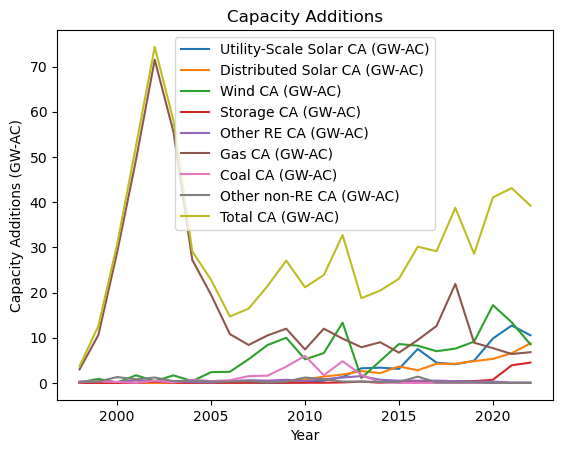

In [6]:
sources = ['Utility-Scale Solar CA (GW-AC)', 'Distributed Solar CA (GW-AC)', 'Wind CA (GW-AC)', 'Storage CA (GW-AC)', 'Other RE CA (GW-AC)', 'Gas CA (GW-AC)', 'Coal CA (GW-AC)', 'Other non-RE CA (GW-AC)', 'Total CA (GW-AC)']

fig, ax = plt.subplots()
for source in sources: 
    line, = ax.plot(df_ca['Year'], df_ca[source], label=source)
    mplcursors.cursor([line], hover=True).connect("add", lambda sel: sel.annotation.set_text(source))
    
ax.set_xlabel('Year')
ax.set_ylabel('Capacity Additions (GW-AC)')
ax.set_title('Capacity Additions')
plt.legend()
#plt.show()

## Length Of Power Purchase Agreement (PPA)
- LOPPA = Length of Power Purchase Agreement

In [79]:
df_loppa = pd.read_excel('Data.xlsx', sheet_name='Length Of PPA')
#print(df_loppa)

## Mean Feed-in Tariff
- MFIT (US Dollar) = Mean Feed In Tariff

In [80]:
df_mfit = pd.read_excel('Data.xlsx', sheet_name='Mean Feed-in Tariff')
#print(df_mfit)

## Electricity Net Generation Per Source
ENG = Electricity Net Generation

In [38]:
df_eng = pd.read_excel('Data.xlsx', sheet_name='Electricity Net Generation')
#print(df_eng)

In [39]:
df_eng['Year'] = df_eng['YYYYMM'].astype(str).str[:4].astype(int)

# Group by year and sum the values
df_eng = df_eng.groupby(['Year', 'Energy Sources'])['ENG (Million Kilowatthours)'].sum().reset_index()

#print(df_eng)

In [40]:
#Pivot operation
df_pivot_eng = df_eng.pivot(index='Year', columns='Energy Sources', values='ENG (Million Kilowatthours)').reset_index()

#Remove the column name for cleaner output
df_pivot_eng.columns.name = None 

#Fill missing values with 0
df_pivot_eng = df_pivot_eng.fillna(0)

#print(df_pivot_eng)

Abbreviations 
- NEP ENG = Nuclear Electric Power Electricity Net Generation (Million Kilowatthours)
- OG ... = Other Gases ...
- HPS ... = Hydroelectric Pumped Storage ...
- CHP ... = Conventional Hydroelectric Power ...
- Total (IOS) ... = Total (including other sources) ...

In [41]:
#Rename the columns
df_pivot_eng = df_pivot_eng.rename(columns={'Coal': 'Coal ENG (MKWHs)', 'Petroleum': 'Petroleum ENG (MKWHs)', 'Natural Gas': 'Natural Gas ENG (MKWHs)', 'Other Gases': 'OG ENG (MKWHs)', 'Nuclear Electric Power': 'NEP ENG (MKWHs)', 'Hydroelectric Pumped Storage': 'HPS ENG (MKWHs)', 'Conventional Hydroelectric Power': 'CHP ENG (MKWHs)', 'Wood': 'Wood ENG (MKWHs)', 'Waste': 'Waste ENG (MKWHs)', 'Geothermal': 'Geothermal ENG (MKWHs)', 'Solar': 'Solar ENG (MKWHs)', 'Wind': 'Wind ENG (MKWHs)', 'Total (including other sources)': 'Total (IOS) ENG (MKWHs)'})
#print(df_pivot_eng)

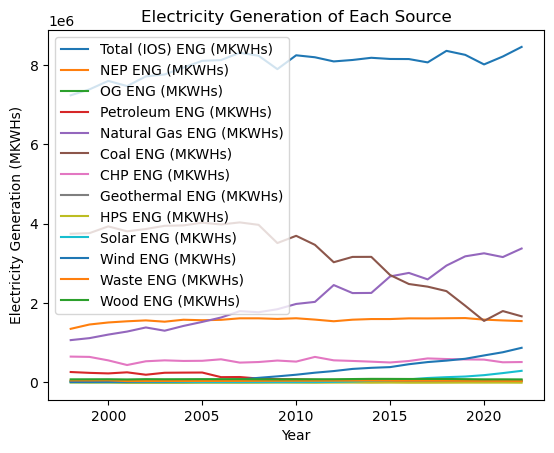

In [42]:
sources = ['Total (IOS) ENG (MKWHs)', 'NEP ENG (MKWHs)', 'OG ENG (MKWHs)', 'Petroleum ENG (MKWHs)', 'Natural Gas ENG (MKWHs)', 'Coal ENG (MKWHs)', 'CHP ENG (MKWHs)', 'Geothermal ENG (MKWHs)', 'HPS ENG (MKWHs)', 'Solar ENG (MKWHs)', 'Wind ENG (MKWHs)', 'Waste ENG (MKWHs)', 'Wood ENG (MKWHs)']

fig, ax = plt.subplots()
for source in sources: 
    line, = ax.plot(df_pivot_eng['Year'], df_pivot_eng[source], label=source)
    mplcursors.cursor([line], hover=True).connect("add", lambda sel: sel.annotation.set_text(source))
    
ax.set_xlabel('Year')
ax.set_ylabel('Electricity Generation (MKWHs)')
ax.set_title('Electricity Generation of Each Source')
plt.legend()
plt.show()

### Extracting New Features From Electricity Net Generation

#### Growth Rate (%)

In [43]:
df_gr_eng = pd.DataFrame()
df_gr_eng['Year'] = df_pivot_eng['Year']

# Calculate the annual growth rate for each energy source
for column in df_pivot_eng.columns[1:]:
    df_gr_eng[column + ' GR%'] = df_pivot_eng[column].pct_change() * 100

#print(df_gr_eng)

In [44]:
#sources = ['CHP ENG (MKWHs) GR%', 'Geothermal ENG (MKWHs) GR%', 'HPS ENG (MKWHs) GR%', 'Solar ENG (MKWHs) GR%', 'Wind ENG (MKWHs) GR%', 'Waste ENG (MKWHs) GR%', 'Wood ENG (MKWHs) GR%']

#fig, ax = plt.subplots()
#for source in sources: 
#    line, = ax.plot(df_gr_eng['Year'], df_gr_eng[source], label=source)
#    mplcursors.cursor([line], hover=True).connect("add", lambda sel: sel.annotation.set_text(source))
    
#ax.set_xlabel('Year')
#ax.set_ylabel('Growth Rate % of Electricity Generation (MKWHs)')
#ax.set_title('Electricity Generation Growth Rate % of Each Source')
#plt.legend()
#plt.show()

In [45]:
#sources = ['Coal ENG (MKWHs) GR%', 'Natural Gas ENG (MKWHs) GR%', 'Petroleum ENG (MKWHs) GR%', 'OG ENG (MKWHs) GR%']

#fig, ax = plt.subplots()
#for source in sources: 
#    line, = ax.plot(df_gr_eng['Year'], df_gr_eng[source], label=source)
#    mplcursors.cursor([line], hover=True).connect("add", lambda sel: sel.annotation.set_text(source))
    
#ax.set_xlabel('Year')
#ax.set_ylabel('Growth Rate % of Electricity Generation (MKWHs)')
#ax.set_title('Electricity Generation Growth Rate % of Each Source')
#plt.legend()
#plt.show()

#### Contribution Of Each Source, Renewables, & Non-renewables To Total Electricty Net Generation
Renewables 
- Conventional hydroelectric power = CHP ENG (MKWHs) 
- Geothermal = Geothermal ENG (MKWHs) 
- Hydroelectric pumped storage = HPS ENG (MKWHs)
- Solar = Solar ENG (MKWHs)
- Wind = Wind ENG (MKWHs)
- Waste (biomass) = Waste ENG (MKWHs)
- Wood (biomass) = Wood ENG (MKWHs)

Non-renewables
- Coal = Coal ENG (MKWHs) 
- Natural gas = Natural Gas ENG (MKWHs)
- Petroleum = Petroleum ENG (MKWHs)
- Other gases = OG ENG (MKWHs)

Non
- Nuclear electric power = NEP ENG (MKWHs)
- Total (ios) = Total (IOS) ENG (MKWHs)

In [47]:
df_con_eng = pd.DataFrame()
df_con_eng['Year'] = df_pivot_eng['Year']

# Contribution of each source
for column in df_pivot_eng.columns[1:]:  # Exclude 'Year' column
    df_con_eng[column + ' Con%'] = (df_pivot_eng[column] / df_pivot_eng['Total (IOS) ENG (MKWHs)']) * 100

df_con_eng = df_con_eng.drop(columns=['Total (IOS) ENG (MKWHs) Con%'])

# Contribution of renewables
renewables = ['CHP ENG (MKWHs)', 'Geothermal ENG (MKWHs)', 'HPS ENG (MKWHs)', 'Solar ENG (MKWHs)', 'Wind ENG (MKWHs)', 'Waste ENG (MKWHs)', 'Wood ENG (MKWHs)']
df_con_eng['Ren ENG (MKWHs) Con%'] = (df_pivot_eng[renewables].sum(axis=1) / df_pivot_eng['Total (IOS) ENG (MKWHs)']) * 100

# Contribution of non-renewables
non_renewables = ['Coal ENG (MKWHs)', 'Natural Gas ENG (MKWHs)', 'Petroleum ENG (MKWHs)', 'OG ENG (MKWHs)']
df_con_eng['NonRen ENG (MKWHs) Con%'] = (df_pivot_eng[non_renewables].sum(axis=1) / df_pivot_eng['Total (IOS) ENG (MKWHs)']) * 100

print(df_con_eng)

    Year  Coal ENG (MKWHs) Con%  CHP ENG (MKWHs) Con%  \
0   1998              51.750353              8.931195   
1   1999              50.911612              8.648240   
2   2000              51.715157              7.247895   
3   2001              50.953640              5.806308   
4   2002              50.101186              6.850644   
5   2003              50.827778              7.102580   
6   2004              49.824279              6.760196   
7   2005              49.634111              6.665674   
8   2006              48.970651              7.116054   
9   2007              48.510450              5.954418   
10  2008              48.206223              6.186147   
11  2009              44.449548              6.922081   
12  2010              44.782144              6.307862   
13  2011              42.277327              7.788876   
14  2012              37.404416              6.824512   
15  2013              38.886589              6.605208   
16  2014              38.638954

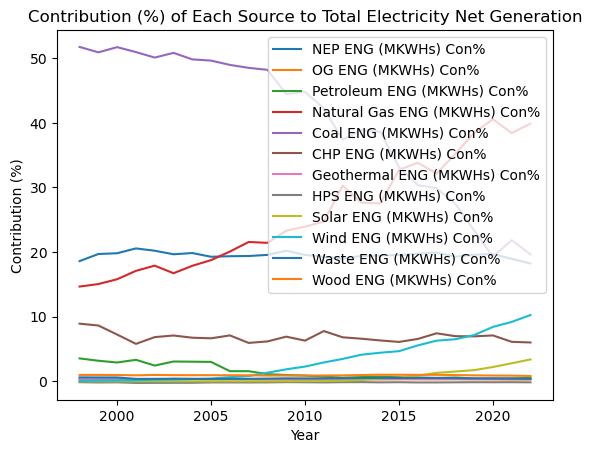

In [18]:
sources = ['NEP ENG (MKWHs) Con%', 'OG ENG (MKWHs) Con%', 'Petroleum ENG (MKWHs) Con%', 'Natural Gas ENG (MKWHs) Con%', 'Coal ENG (MKWHs) Con%', 'CHP ENG (MKWHs) Con%', 'Geothermal ENG (MKWHs) Con%', 'HPS ENG (MKWHs) Con%', 'Solar ENG (MKWHs) Con%', 'Wind ENG (MKWHs) Con%', 'Waste ENG (MKWHs) Con%', 'Wood ENG (MKWHs) Con%']

fig, ax = plt.subplots()
for source in sources: 
    line, = ax.plot(df_con_eng['Year'], df_con_eng[source], label=source)
    mplcursors.cursor([line], hover=True).connect("add", lambda sel: sel.annotation.set_text(source))
    
ax.set_xlabel('Year')
ax.set_ylabel('Contribution (%)')
ax.set_title('Contribution (%) of Each Source to Total Electricity Net Generation')
plt.legend()
#plt.show()

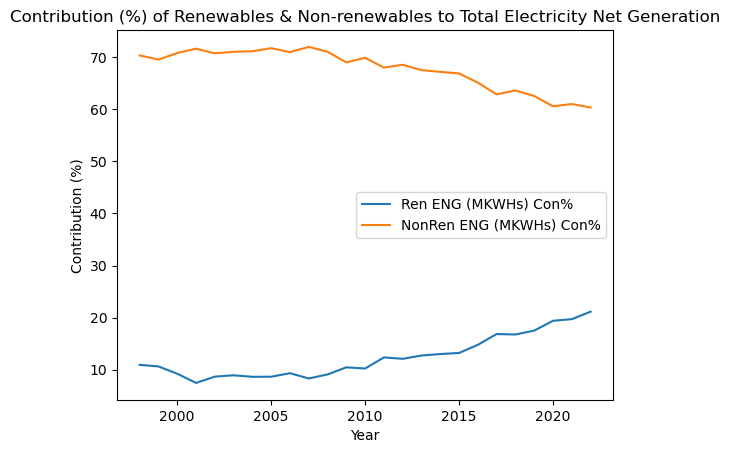

In [19]:
sources = ['Ren ENG (MKWHs) Con%', 'NonRen ENG (MKWHs) Con%']

fig, ax = plt.subplots()
for source in sources: 
    line, = ax.plot(df_con_eng['Year'], df_con_eng[source], label=source)
    mplcursors.cursor([line], hover=True).connect("add", lambda sel: sel.annotation.set_text(source))
    
ax.set_xlabel('Year')
ax.set_ylabel('Contribution (%)')
ax.set_title('Contribution (%) of Renewables & Non-renewables to Total Electricity Net Generation')
plt.legend()
plt.show()

## Electric Net Summer Capacity Per Source
ENSC (Million Kilowatts) = Electric Net Summer Capacity (Million Kilowatts)

In [39]:
pd.options.display.float_format = '{:.3f}'.format
df_ensc = pd.read_excel('Data.xlsx', sheet_name='Electric Net Summer Capacity')
#print(df_ensc)

PermissionError: [Errno 13] Permission denied: 'Data.xlsx'

In [ ]:
#Pivot operation
df_pivot_ensc = df_ensc.pivot(index='Year', columns='Energy Sources', values='ENSC (Million Kilowatts)').reset_index()

#Remove the column name for cleaner output
df_pivot_ensc.columns.name = None 

#Fill missing values with 0
df_pivot_ensc = df_pivot_ensc.fillna(0)

#print(df_pivot_ensc)

Abbreviations 
- NEP ENSC (MKWs) = Nuclear Electric Power ENSC (Million Kilowatts)
- OG ... = Other Gases ...
- HPS ... = Hydroelectric Pumped Storage ...
- CHP ... = Conventional Hydroelectric Power ...
- Total (IOS) ... = Total (including other sources) ...

In [40]:
#Rename the columns
#df_pivot_ensc = df_pivot_ensc.rename(columns={'Coal': 'Coal ENSC (MKWs)', 'Petroleum': 'Petroleum ENSC (MKWs)', 'Natural Gas': 'Natural Gas ENSC (MKWs)', 'Other Gases': 'OG ENSC (MKWs)', 'Nuclear Electric Power': 'NEP ENSC (MKWs)', 'Hydroelectric Pumped Storage': 'HPS ENSC (MKWs)', 'Conventional Hydroelectric Power': 'CHP ENSC (MKWs)', 'Wood': 'Wood ENSC (MKWs)', 'Waste': 'Waste ENSC (MKWs)', 'Geothermal': 'Geothermal ENSC (MKWs)', 'Solar': 'Solar ENSC (MKWs)', 'Wind': 'Wind ENSC (MKWs)', 'Total (including other sources)': 'Total (IOS) ENSC (MKWs)'})
print(df_pivot_ensc)

    Year    Coal  Conventional Hydroelectric Power  Geothermal  \
0   1998 315.786                            79.151       2.893   
1   1999 315.496                            79.393       2.846   
2   2000 315.113                            79.359       2.793   
3   2001 314.231                            78.917       2.216   
4   2002 315.350                            79.357       2.252   
5   2003 313.019                            78.694       2.134   
6   2004 313.020                            77.641       2.152   
7   2005 313.380                            77.540       2.286   
8   2006 312.956                            77.822       2.274   
9   2007 312.739                            77.885       2.214   
10  2008 313.322                            77.930       2.229   
11  2009 314.294                            78.518       2.382   
12  2010 317.339                            78.825       2.405   
13  2011 317.640                            78.652       2.409   
14  2012 3

### Extracting New Features From Electric Net Summer Capacity

#### Annual Growth Rate

In [85]:
df_gr_ensc = pd.DataFrame()
df_gr_ensc['Year'] = df_pivot_ensc['Year']

# Calculate the annual growth rate for each energy source
for column in df_pivot_ensc.columns[1:]:
    df_gr_ensc[column + ' GR%'] = df_pivot_ensc[column].pct_change() * 100

#print(df_gr_ensc)

NameError: name 'df_pivot_ensc' is not defined

#### Contribution Of Each Source, Renewables, & Non-renewables To Total Electric Net Summer Capacity
Renewables 
- Conventional hydroelectric power = CHP ENSC (MKWs) 
- Geothermal = Geothermal ENSC (MKWs)
- Hydroelectric pumped storage = HPS ENSC (MKWs)
- Solar = Solar ENSC (MKWs)
- Wind = Wind ENSC (MKWs)
- Waste (biomass) = Waste ENSC (MKWs)
- Wood (biomass) = Wood ENSC (MKWs)

Non-renewables
- Coal = Coal ENSC (MKWs)
- Natural gas = Natural Gas ENSC (MKWs)
- Petroleum = Petroleum ENSC (MKWs)
- Other gases = OG ENSC (MKWs)

Non
- Nuclear electric power = NEP ENSC (MKWs)
- Total (ios) = Total (IOS) ENSC (MKWs)

In [24]:
df_con_ensc = pd.DataFrame()
df_con_ensc['Year'] = df_pivot_ensc['Year']

# Contribution of each source
for column in df_pivot_ensc.columns[1:]:  # Exclude 'Year' column
    df_con_ensc[column + ' Con%'] = (df_pivot_ensc[column] / df_pivot_ensc['Total (IOS) ENSC (MKWs)']) * 100

df_con_ensc = df_con_ensc.drop(columns=['Total (IOS) ENSC (MKWs) Con%'])

# Contribution of renewables
renewables = ['CHP ENSC (MKWs)', 'Geothermal ENSC (MKWs)', 'HPS ENSC (MKWs)', 'Solar ENSC (MKWs)', 'Wind ENSC (MKWs)', 'Waste ENSC (MKWs)', 'Wood ENSC (MKWs)']
df_con_ensc['Ren ENSC (MKWs) Con%'] = (df_pivot_ensc[renewables].sum(axis=1) / df_pivot_ensc['Total (IOS) ENSC (MKWs)']) * 100

# Contribution of non-renewables
non_renewables = ['Coal ENSC (MKWs)', 'Natural Gas ENSC (MKWs)', 'Petroleum ENSC (MKWs)', 'OG ENSC (MKWs)']
df_con_ensc['NonRen ENSC (MKWs) Con%'] = (df_pivot_ensc[non_renewables].sum(axis=1) / df_pivot_ensc['Total (IOS) ENSC (MKWs)']) * 100

#print(df_con_ensc)

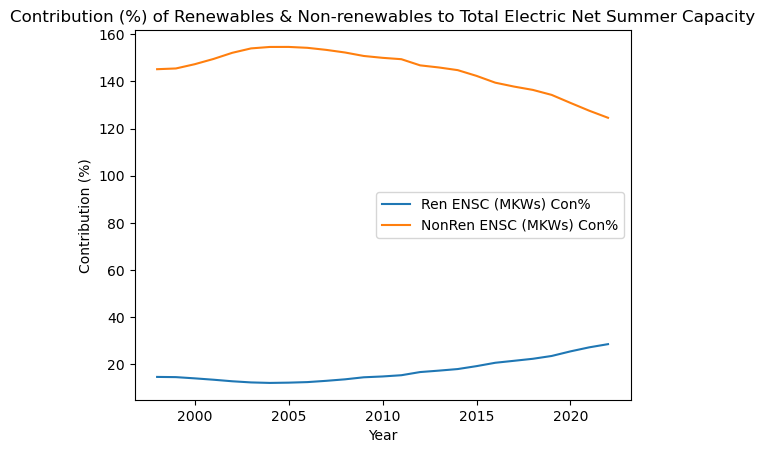

In [25]:
sources = ['Ren ENSC (MKWs) Con%', 'NonRen ENSC (MKWs) Con%']

fig, ax = plt.subplots()
for source in sources: 
    line, = ax.plot(df_con_ensc['Year'], df_con_ensc[source], label=source)
    mplcursors.cursor([line], hover=True).connect("add", lambda sel: sel.annotation.set_text(source))
    
ax.set_xlabel('Year')
ax.set_ylabel('Contribution (%)')
ax.set_title('Contribution (%) of Renewables & Non-renewables to Total Electric Net Summer Capacity')
plt.legend()
plt.show()

## Capacity Factor Per Source

In [86]:
df_cf = pd.read_excel('Data.xlsx', sheet_name='Capacity & Usage Factor')
#print(df_cf)

### Extracting New Features From Capacity Factors
#### Annual Growth Rate

In [81]:
df_gr_cf = pd.DataFrame()
df_gr_cf['Year'] = df_cf['Year']

# Calculate the annual growth rate for each energy source
for column in df_cf.columns[1:]:
    df_gr_cf[column + ' GR%'] = df_cf[column].pct_change() * 100

#print(df_gr_cf)

# Merging the eng & ensc

In [87]:
eng_ensc = pd.merge(df_pivot_eng, df_pivot_ensc, on=['Year'], how='outer') #df = pd.merge(df_us, eng_ensc, on='Year')
#print(eng_ensc)

NameError: name 'df_pivot_ensc' is not defined

Policy changes: Binary variables representing the presence or absence of significant policy changes or incentives related to renewable energy adoption in each year => help assess the impact of policy interventions on solar capacity additions.

data for policy changes: https://www.iea.org/policies?technology%5B0%5D=Solar%20PV&country%5B0%5D=United%20States&sector%5B0%5D=Electricity%20and%20heat%20generation

- U.S. electricty generation by source 1998-2022